In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

from pylab import rcParams
rcParams['figure.figsize'] = 10, 8
rcParams['figure.dpi'] = 300

import torch
from torch import nn
from torch import distributions
from torch.nn.parameter import Parameter

from sklearn import cluster, datasets, mixture
from sklearn.preprocessing import StandardScaler
from scipy import stats
import math

In [53]:
class RealNVP(nn.Module):
    def __init__(self, nets, nett, mask, net_miu, net_sigma,prior):
        super(RealNVP, self).__init__()
        
        self.prior = prior
        self.mask = nn.Parameter(mask, requires_grad=False)
        self.t = torch.nn.ModuleList([nett() for _ in range(len(masks))])
        self.s = torch.nn.ModuleList([nets() for _ in range(len(masks))])
        self.net_miu = torch.nn.ModuleList([net_miu()])
        self.net_sigma = torch.nn.ModuleList([net_sigma()])
        
    def g(self, z,x_t):
        x = z
        for i in range(len(self.t)):
            x_ = x*self.mask[i]
            s = self.s[i](torch.cat((x_,x_t),1))*(1 - self.mask[i])
            t = self.t[i](torch.cat((x_,x_t),1))*(1 - self.mask[i])
            x = x_ + (1 - self.mask[i]) * (x * torch.exp(s) + t)
        return x

    def f(self, x, x_t):
        log_det_J, z = x.new_zeros(x.shape[0]), x
        for i in reversed(range(len(self.t))):
            z_ = self.mask[i] * z
            s = self.s[i](torch.cat((z_,x_t),1)) * (1-self.mask[i])
            t = self.t[i](torch.cat((z_,x_t),1)) * (1-self.mask[i])
            z = (1 - self.mask[i]) * (z - t) * torch.exp(-s) + z_
            log_det_J -= s.sum(dim=1)
        return z, log_det_J
    
    def f_z(self,x_t):
        miu = self.net_miu[0](x_t)
        sigma = self.net_sigma[0](x_t)
        return miu, sigma
    
    def log_prob(self,x,x_t):
        z, logp = self.f(x,x_t)
        miu,sigma = self.f_z(x_t)
#         print(sigma)
        L = 0.5*torch.log(torch.Tensor([2*math.pi]))+torch.log(sigma)+torch.div(torch.mul((z-miu),(z-miu)),2*torch.mul(sigma,sigma))
        L = L[:,0:1]+L[:,1:2]
#         print(torch.sum(L))
#         print(torch.sum(L))
        return  -L + logp
        
    def test(self, x_t): 
        z = self.prior.sample((x_t.shape[0], 1))
        z = torch.squeeze(z)
        miu,sigma = self.f_z(x_t)
        z_cali = z*sigma +miu
        x = self.g(z_cali,x_t)
        return x[:,0:1],x[:,1:2]

In [54]:
nets = lambda: nn.Sequential(nn.Linear(4, 256), nn.LeakyReLU(), nn.Linear(256, 256), nn.LeakyReLU(), nn.Linear(256, 2), nn.Tanh())
nett = lambda: nn.Sequential(nn.Linear(4, 256), nn.LeakyReLU(), nn.Linear(256, 256), nn.LeakyReLU(), nn.Linear(256, 2))
net_miu = lambda: nn.Sequential(nn.Linear(2, 64), nn.LeakyReLU(), nn.Linear(64, 64), nn.LeakyReLU(), nn.Linear(64, 2), nn.Tanh())
net_sigma = lambda: nn.Sequential(nn.Linear(2, 64), nn.LeakyReLU(), nn.Linear(64, 64), nn.LeakyReLU(), nn.Linear(64, 2), nn.Sigmoid())
masks = torch.from_numpy(np.array([[0, 1], [1, 0]] * 3).astype(np.float32))
prior = distributions.MultivariateNormal(torch.zeros(2), torch.eye(2))
flow = RealNVP(nets, nett, masks, net_miu, net_sigma,prior)

In [56]:
import scipy.io
import numpy as np
from torch.utils.data import DataLoader
# Noise level (in this noise free case is zero)
noise = 0.02
N_noise = 20 
N_u = 20000
N_loop = 16


data = scipy.io.loadmat('ARZ_greenshieldSim_epsbell_infer_ring_May14_0.02tau.mat')


t = data['t'].flatten()[:,None]# 960 by 1
x = data['x'].flatten()[:,None]# 241 by 1
Exact_rho = np.real(data['rho']).T #241 by 960, and after transpose, becomes 960*241
Exact_u = np.real(data['u']).T

print(len(t), len(t[0]))
print(len(x), len(x[0]))
print(N_loop-1)
print(N_loop-1)


X, T = np.meshgrid(x,t) # each is 960 by 241

X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None])) # hstack is column wise stack, 241*960 (after flatten) by 2

data2 = np.array([0.0]*960)
idx2 = np.random.choice(range(960), 750, replace=False) # points on the boundary
#idx2 = np.array(list(range(960)))# all boundary points are uses for regularization
X_star2 = np.hstack((data2.flatten()[:,None], t.flatten()[:,None]))


idx3 = np.random.choice(range(960*241), 150000, replace=False) # collocation points
X_star3 = X_star[idx3,:]


rho_star = Exact_rho.flatten()[:,None] # 241*960 by 1
u_star = Exact_u.flatten()[:,None] # 241*960 by 1


# Doman bounds
lb = X_star.min(0) # [0, 0]
ub = X_star.max(0) # [1, 3] 

print(lb)
print(ub)

######################################################################
######################## Noiseles Data ###############################
######################################################################

if N_loop>1:
    gap = int(240.0/(N_loop-1))
    loopidx = [i*gap for i in range(N_loop-1)]
    if N_loop ==4: loopidx[-1]=120
    loopidx.append(239)
else:
    loopidx = [0]

span = np.array(loopidx)

idx = []
for i in range(960):
    seg = list(span+i*241)
    idx+= seg


#idx = list(range(241)) # only use the initial
print(len(idx))
X_rho_train = X_star[idx,:]
rho_train = rho_star[idx,:]
u_train = u_star[idx,:]

X_rho_repeat = np.repeat(X_rho_train,N_noise,axis = 0)
print('X_rho_repeat',X_rho_repeat.shape)

rho_train_repeat = rho_train + noise*np.random.randn(rho_train.shape[0], rho_train.shape[1])
for i in range(N_noise-1):
    rho_train_repeat = np.hstack((rho_train_repeat, rho_train + noise*np.random.randn(rho_train.shape[0], rho_train.shape[1])))
rho_train_repeat = rho_train_repeat.reshape(-1,1)
print('rho_train_repeat',rho_train_repeat.shape)

u_train_repeat = u_train + noise*np.random.randn(u_train.shape[0], u_train.shape[1])
for i in range(N_noise-1):
    u_train_repeat = np.hstack((u_train_repeat, u_train + noise*np.random.randn(u_train.shape[0], u_train.shape[1])))
u_train_repeat = u_train_repeat.reshape(-1,1)
rho_u_repeat = np.concatenate((rho_train_repeat,u_train_repeat),axis=1)
print('u_train_repeat',u_train_repeat.shape)
X_rho_repeat = X_rho_repeat.astype(np.float32)
rho_u_repeat = rho_u_repeat.astype(np.float32)
X_rho_u  = np.concatenate((rho_u_repeat, X_rho_repeat),axis=1)
X_rho_u_dataloader  = DataLoader(X_rho_u, batch_size=5000,shuffle=True)

960 1
241 1
15
15
[0. 0.]
[1.0041841 3.       ]
15360
X_rho_repeat (307200, 2)
rho_train_repeat (307200, 1)
u_train_repeat (307200, 1)


In [67]:
optimizer = torch.optim.Adam([p for p in flow.parameters() if p.requires_grad==True], lr=1e-4)
for step in range(10001):    
#     noisy_moons = datasets.make_moons(n_samples=100, noise=.05)[0].astype(np.float32)
    X_rho_u_step = next(iter(X_rho_u_dataloader))
    label_step = X_rho_u_step[:,0:2]
    condition_step = X_rho_u_step[:,2:4]
    loss = -flow.log_prob(label_step,condition_step).mean()
    optimizer.zero_grad()
    loss.backward(retain_graph=True)
    optimizer.step()
    
    if step % 500 == 0:
        print('iter %s:' % step, 'loss = %.3f' % loss)

iter 0: loss = -4.912
iter 500: loss = -4.866
iter 1000: loss = -4.810
iter 1500: loss = -4.831
iter 2000: loss = -4.889
iter 2500: loss = -4.917
iter 3000: loss = -4.907
iter 3500: loss = -4.866
iter 4000: loss = -4.923
iter 4500: loss = -4.918
iter 5000: loss = -4.922
iter 5500: loss = -4.892
iter 6000: loss = -4.941
iter 6500: loss = -4.931
iter 7000: loss = -4.890
iter 7500: loss = -4.834
iter 8000: loss = -4.938
iter 8500: loss = -4.907
iter 9000: loss = -4.900
iter 9500: loss = -4.855
iter 10000: loss = -4.932


In [68]:
from scipy.interpolate import griddata
N_samples = 100
samples_mean_rho = np.zeros((X_star.shape[0], N_samples))
samples_mean_u = np.zeros((X_star.shape[0], N_samples))
for i in range(0, N_samples):
    rho_tensor, u_tensor = flow.test(torch.from_numpy(X_star.astype(np.float32)))
    samples_mean_rho[:,i:i+1],samples_mean_u[:,i:i+1] = rho_tensor.detach().numpy(), u_tensor.detach().numpy()
exact_sample_rho = rho_star
exact_sample_u = u_star
b = exact_sample_rho
c = exact_sample_u
for i in range(N_samples-1):
    bb = b + noise * np.random.randn(rho_star.shape[0],1)
    exact_sample_rho = np.hstack((exact_sample_rho, bb))
    cc = c + noise * np.random.randn(u_star.shape[0],1)
    exact_sample_u = np.hstack((exact_sample_u, cc))
# Compare mean and variance of the predicted samples as prediction and uncertainty
RHO_pred = np.mean(samples_mean_rho, axis = 1)
U_pred = np.mean(samples_mean_u, axis = 1)
RHO_pred = griddata(X_star, RHO_pred.flatten(), (X, T), method='cubic')
U_pred = griddata(X_star, U_pred.flatten(), (X, T), method='cubic')
#     Sigma_pred = np.var(samples_mean, axis = 1)
#     Sigma_pred = griddata(X_star, Sigma_pred, (X, T), method='cubic')

# Compare the relative error between the prediciton and the reference solution 
error_rho = np.linalg.norm(Exact_rho-RHO_pred,2)/np.linalg.norm(Exact_rho,2)
error_u = np.linalg.norm(Exact_u-U_pred,2)/np.linalg.norm(Exact_u,2)
print('Error rho: %e, Error u: %e' % (error_rho, error_u))
# np.save('L2_error.npy', error_u)

Error rho: 2.781706e-02, Error u: 5.190482e-03


In [69]:
Sigma_pred_rho = np.var(samples_mean_rho, axis = 1)
Sigma_pred_rho = griddata(X_star, Sigma_pred_rho, (X, T), method='cubic')

Sigma_pred_u = np.var(samples_mean_u, axis = 1)
Sigma_pred_u = griddata(X_star, Sigma_pred_u, (X, T), method='cubic')

No handles with labels found to put in legend.


Text(0.5, 1.0, 'Variance of $rho(t,x)$')

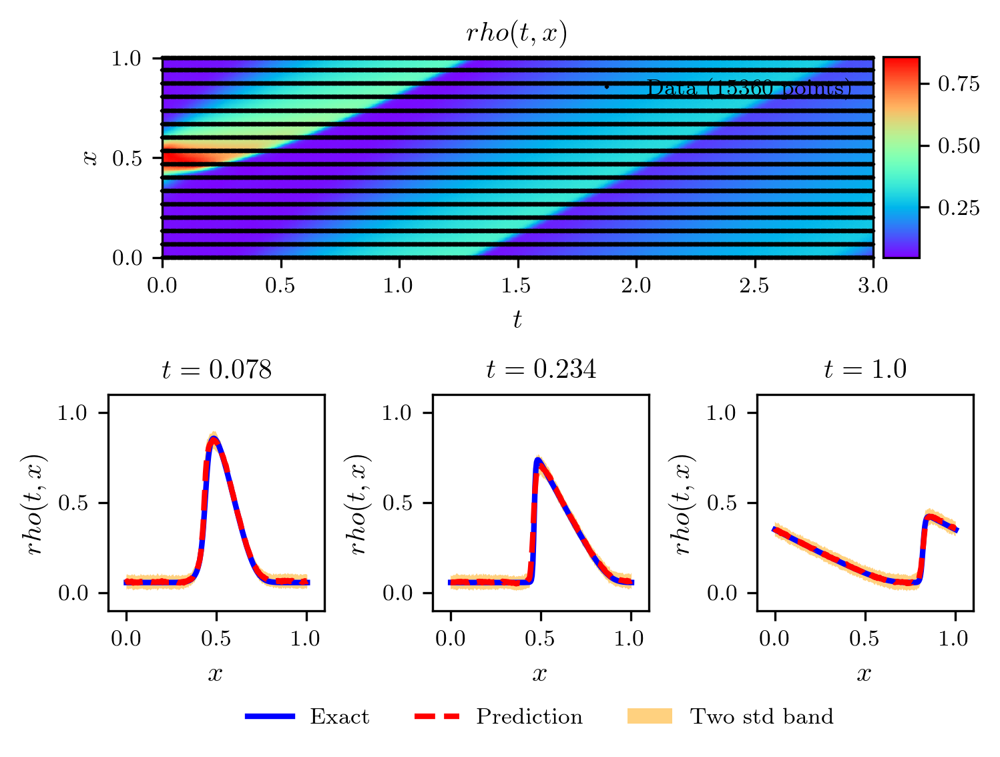

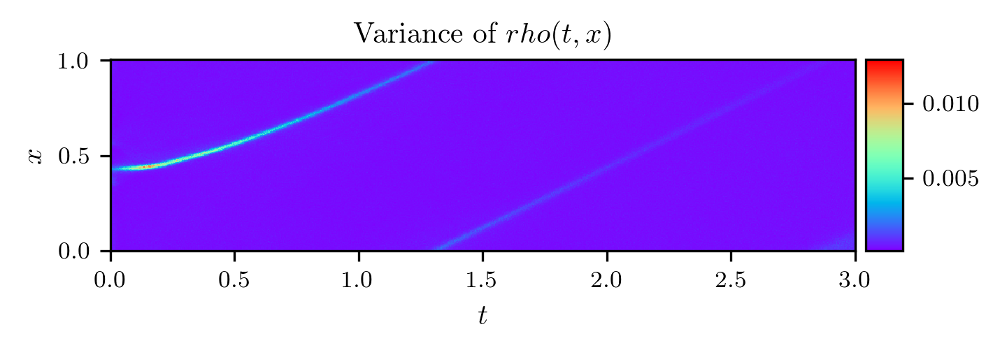

In [70]:
from plotting import newfig, savefig
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1 import make_axes_locatable
fig, ax = newfig(1.0, 1.1)
ax.axis('off')

####### Row 0: u(t,x) ##################    
gs0 = gridspec.GridSpec(1, 2)
gs0.update(top=1-0.06, bottom=1-1/3, left=0.15, right=0.85, wspace=0)
ax = plt.subplot(gs0[:, :])

h = ax.imshow(RHO_pred.T, interpolation='nearest', cmap='rainbow', 
              extent=[t.min(), t.max(), x.min(), x.max()], 
              origin='lower', aspect='auto')
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
fig.colorbar(h, cax=cax)

ax.plot(X_rho_train[:,1:2], X_rho_train[:,0:1], 'kx', label = 'Data (%d points)' % (rho_train.shape[0]), markersize = 1, clip_on = False)

# line = np.linspace(x.min(), x.max(), 2)[:,None]
# ax.plot(t[25]*np.ones((2,1)), line, 'w-', linewidth = 1)
# ax.plot(t[50]*np.ones((2,1)), line, 'w-', linewidth = 1)
# ax.plot(t[75]*np.ones((2,1)), line, 'w-', linewidth = 1)    

ax.set_xlabel('$t$')
ax.set_ylabel('$x$')
ax.legend(frameon=False, loc = 'best')
ax.set_title('$rho(t,x)$', fontsize = 10)


####### Row 1: u(t,x) slices ##################    
gs1 = gridspec.GridSpec(1, 3)
gs1.update(top=1-1/3, bottom=0, left=0.1, right=0.9, wspace=0.5)

ax = plt.subplot(gs1[0, 0])
ax.plot(x,Exact_rho[25,:], 'b-', linewidth = 2, label = 'Exact')       
ax.plot(x,RHO_pred[25,:], 'r--', linewidth = 2, label = 'Prediction')
lower = RHO_pred[25,:] - 2.0*np.sqrt(Sigma_pred_rho[25,:])
upper = RHO_pred[25,:] + 2.0*np.sqrt(Sigma_pred_rho[25,:])
plt.fill_between(x.flatten(), lower.flatten(), upper.flatten(), 
                 facecolor='orange', alpha=0.5, label="Two std band")
ax.set_xlabel('$x$')
ax.set_ylabel('$rho(t,x)$')    
ax.set_title('$t = 0.078$', fontsize = 10)
ax.axis('square')
ax.set_xlim([-0.1,1.1])
ax.set_ylim([-0.1,1.1])

ax = plt.subplot(gs1[0, 1])
ax.plot(x,Exact_rho[75,:], 'b-', linewidth = 2, label = 'Exact')       
ax.plot(x,RHO_pred[75,:], 'r--', linewidth = 2, label = 'Prediction')
lower = RHO_pred[75,:] - 2.0*np.sqrt(Sigma_pred_rho[75,:])
upper = RHO_pred[75,:] + 2.0*np.sqrt(Sigma_pred_rho[75,:])
plt.fill_between(x.flatten(), lower.flatten(), upper.flatten(), 
                 facecolor='orange', alpha=0.5, label="Two std band")
ax.set_xlabel('$x$')
ax.set_ylabel('$rho(t,x)$')
ax.axis('square')
ax.set_xlim([-0.1,1.1])
ax.set_ylim([-0.1,1.1])
ax.set_title('$t = 0.234$', fontsize = 10)
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.35), ncol=5, frameon=False)

ax = plt.subplot(gs1[0, 2])
ax.plot(x,Exact_rho[320,:], 'b-', linewidth = 2, label = 'Exact')       
ax.plot(x,RHO_pred[320,:], 'r--', linewidth = 2, label = 'Prediction')
lower = RHO_pred[320,:] - 2.0*np.sqrt(Sigma_pred_rho[320,:])
upper = RHO_pred[320,:] + 2.0*np.sqrt(Sigma_pred_rho[320,:])
plt.fill_between(x.flatten(), lower.flatten(), upper.flatten(), 
                 facecolor='orange', alpha=0.5, label="Two std band")
ax.set_xlabel('$x$')
ax.set_ylabel('$rho(t,x)$')
ax.axis('square')
ax.set_xlim([-0.1,1.1])
ax.set_ylim([-0.1,1.1])     
ax.set_title('$t = 1.0$', fontsize = 10)

# savefig(path_error+'prediction_rho')
fig, ax = newfig(1.0)
ax.axis('off')

#############       Uncertainty       ##################
gs2 = gridspec.GridSpec(1, 2)
gs2.update(top=1-0.06, bottom=1-1/3, left=0.15, right=0.85, wspace=0)
ax = plt.subplot(gs2[:, :])

h = ax.imshow(Sigma_pred_rho.T, interpolation='nearest', cmap='rainbow', 
              extent=[t.min(), t.max(), x.min(), x.max()], 
              origin='lower', aspect='auto')
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
fig.colorbar(h, cax=cax)
ax.set_xlabel('$t$')
ax.set_ylabel('$x$')
ax.legend(frameon=False, loc = 'best')
ax.set_title('Variance of $rho(t,x)$', fontsize = 10)
# savefig(path_error+'variance_rho')

In [71]:
def draw_normal(sample):
    xmin, xmax = sample.min(), sample.max()
    X_marginal_1 = np.linspace(xmin, xmax, 100)[:,None]
    positions_marginal_1 = X_marginal_1.flatten()
    values_marginal_1 = sample.flatten()
    gkde = stats.gaussian_kde(values_marginal_1)
    KDE_marginal_1 = gkde.evaluate(positions_marginal_1)
    
    return X_marginal_1, KDE_marginal_1

In [72]:
def draw_compare(x,t,nx,nt,num):
    index = int(240*t*320 + 240*x)
    sample = samples_mean_rho[index,:][:,None]
    true_sample = exact_sample_rho[index,:][:,None]
    X_marginal_1, KDE_marginal_1 = draw_normal(sample)
    X_marginal_2, KDE_marginal_2 = draw_normal(true_sample)
    plt.subplot(7,5,num)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.hist(true_sample, bins = 50, density=True, alpha = 0.6, color='blue')
    plt.hist(sample, bins = 50, density=True, alpha = 0.6, color='red')
    plt.plot(X_marginal_2, KDE_marginal_2, 'b-', label = 'Exact')
    plt.plot(X_marginal_1, KDE_marginal_1, 'r-', label = 'Prediction')
    plt.xlabel('$rho(x,t=%.2e,%.2e)$' %(XX_star[index],TT_star[index]),fontsize=20)
    plt.ylabel('$p(rho)$',fontsize=20)
    plt.legend(loc='upper left', frameon=False, prop={'size': 20})
#     plt.show()

In [73]:
def draw_compare_u(x,t,nx,nt,num):
    index = int(240*t*320 + 240*x)
    sample = samples_mean_u[index,:][:,None]
    true_sample = exact_sample_u[index,:][:,None]
    X_marginal_1, KDE_marginal_1 = draw_normal(sample)
    X_marginal_2, KDE_marginal_2 = draw_normal(true_sample)
    plt.subplot(7,5,num)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.hist(true_sample, bins = 50, density=True, alpha = 0.6, color='blue')
    plt.hist(sample, bins = 50, density=True, alpha = 0.6, color='red')
    plt.plot(X_marginal_2, KDE_marginal_2, 'b-', label = 'Exact')
    plt.plot(X_marginal_1, KDE_marginal_1, 'r-', label = 'Prediction')
    plt.xlabel('$u(x,t=%.2e,%.2e)$' %(XX_star[index],TT_star[index]),fontsize=20)
    plt.ylabel('$p(u)$',fontsize=20)
    plt.legend(loc='upper left', frameon=False, prop={'size': 20})

In [74]:
XX_star = X_star[:,0][:,None]
TT_star = X_star[:,1][:,None]
xx,tt = np.array([0,0.25,0.5,0.75,1.0]), np.array([0,0.5,1.0,1.5,2.0,2.5,3.0])
XX, TT = np.meshgrid(xx,tt)
XX= XX.flatten()[:,None]
TT= TT.flatten()[:,None]
print(XX.shape[0])
plt.figure(figsize = (50,40))
plt.figure(1)
for i in range(len(XX)):
    draw_compare(XX[i],TT[i],xx.shape[0],tt.shape[0],i+1)
# savefig(path_error+'distribution_rho')

35


No handles with labels found to put in legend.


Text(0.5, 1.0, 'Variance of $u(t,x)$')

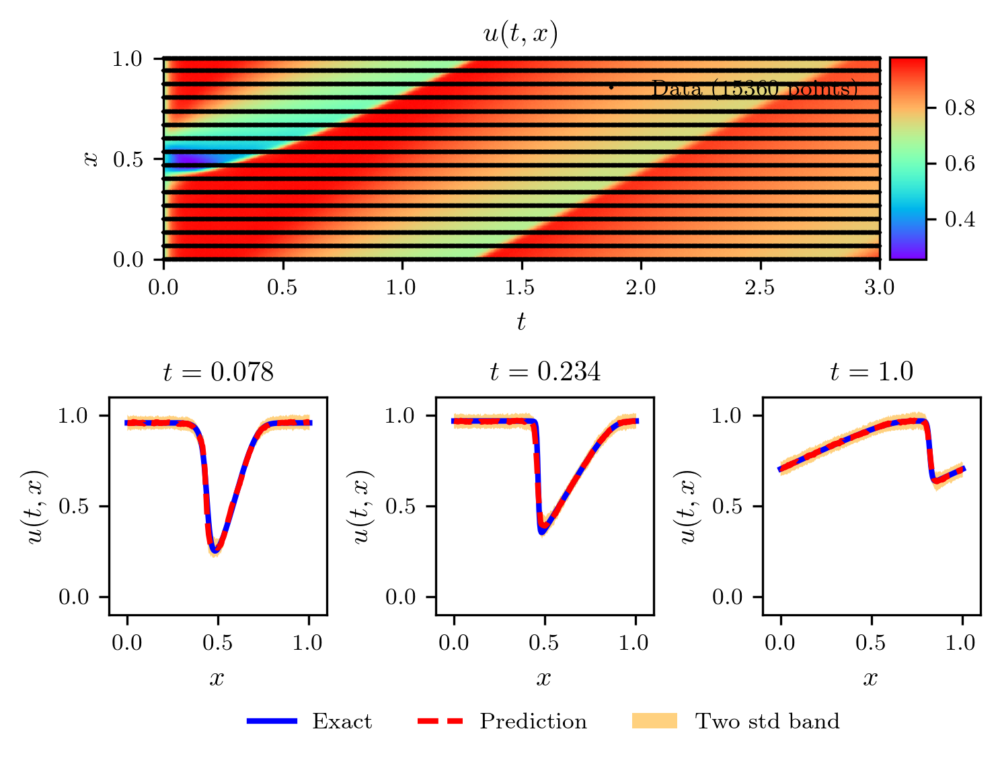

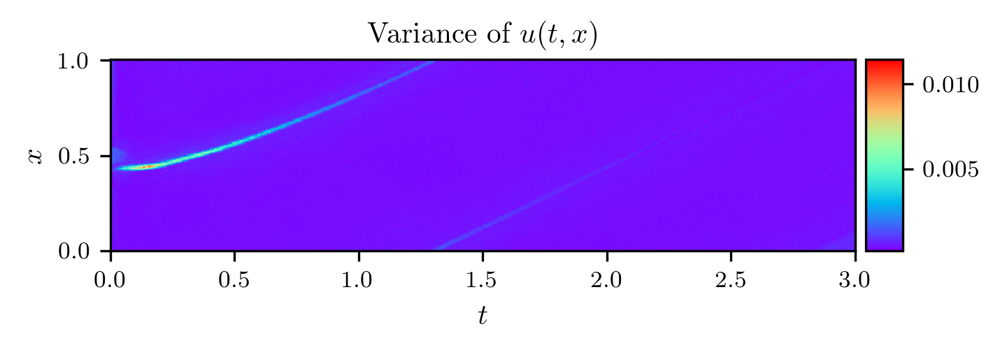

In [75]:
fig, ax = newfig(1.0, 1.1)
ax.axis('off')

####### Row 0: u(t,x) ##################    
gs0 = gridspec.GridSpec(1, 2)
gs0.update(top=1-0.06, bottom=1-1/3, left=0.15, right=0.85, wspace=0)
ax = plt.subplot(gs0[:, :])

h = ax.imshow(U_pred.T, interpolation='nearest', cmap='rainbow', 
              extent=[t.min(), t.max(), x.min(), x.max()], 
              origin='lower', aspect='auto')
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
fig.colorbar(h, cax=cax)

ax.plot(X_rho_train[:,1:2], X_rho_train[:,0:1], 'kx', label = 'Data (%d points)' % (rho_train.shape[0]), markersize = 1, clip_on = False)

# line = np.linspace(x.min(), x.max(), 2)[:,None]
# ax.plot(t[25]*np.ones((2,1)), line, 'w-', linewidth = 1)
# ax.plot(t[50]*np.ones((2,1)), line, 'w-', linewidth = 1)
# ax.plot(t[75]*np.ones((2,1)), line, 'w-', linewidth = 1)    

ax.set_xlabel('$t$')
ax.set_ylabel('$x$')
ax.legend(frameon=False, loc = 'best')
ax.set_title('$u(t,x)$', fontsize = 10)


####### Row 1: u(t,x) slices ##################    
gs1 = gridspec.GridSpec(1, 3)
gs1.update(top=1-1/3, bottom=0, left=0.1, right=0.9, wspace=0.5)

ax = plt.subplot(gs1[0, 0])
ax.plot(x,Exact_u[25,:], 'b-', linewidth = 2, label = 'Exact')       
ax.plot(x,U_pred[25,:], 'r--', linewidth = 2, label = 'Prediction')
lower = U_pred[25,:] - 2.0*np.sqrt(Sigma_pred_u[25,:])
upper = U_pred[25,:] + 2.0*np.sqrt(Sigma_pred_u[25,:])
plt.fill_between(x.flatten(), lower.flatten(), upper.flatten(), 
                 facecolor='orange', alpha=0.5, label="Two std band")
ax.set_xlabel('$x$')
ax.set_ylabel('$u(t,x)$')    
ax.set_title('$t = 0.078$', fontsize = 10)
ax.axis('square')
ax.set_xlim([-0.1,1.1])
ax.set_ylim([-0.1,1.1])

ax = plt.subplot(gs1[0, 1])
ax.plot(x,Exact_u[75,:], 'b-', linewidth = 2, label = 'Exact')       
ax.plot(x,U_pred[75,:], 'r--', linewidth = 2, label = 'Prediction')
lower = U_pred[75,:] - 2.0*np.sqrt(Sigma_pred_u[75,:])
upper = U_pred[75,:] + 2.0*np.sqrt(Sigma_pred_u[75,:])
plt.fill_between(x.flatten(), lower.flatten(), upper.flatten(), 
                 facecolor='orange', alpha=0.5, label="Two std band")
ax.set_xlabel('$x$')
ax.set_ylabel('$u(t,x)$')
ax.axis('square')
ax.set_xlim([-0.1,1.1])
ax.set_ylim([-0.1,1.1])
ax.set_title('$t = 0.234$', fontsize = 10)
ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.35), ncol=5, frameon=False)

ax = plt.subplot(gs1[0, 2])
ax.plot(x,Exact_u[320,:], 'b-', linewidth = 2, label = 'Exact')       
ax.plot(x,U_pred[320,:], 'r--', linewidth = 2, label = 'Prediction')
lower = U_pred[320,:] - 2.0*np.sqrt(Sigma_pred_u[320,:])
upper = U_pred[320,:] + 2.0*np.sqrt(Sigma_pred_u[320,:])
plt.fill_between(x.flatten(), lower.flatten(), upper.flatten(), 
                 facecolor='orange', alpha=0.5, label="Two std band")
ax.set_xlabel('$x$')
ax.set_ylabel('$u(t,x)$')
ax.axis('square')
ax.set_xlim([-0.1,1.1])
ax.set_ylim([-0.1,1.1])     
ax.set_title('$t = 1.0$', fontsize = 10)
# path_error = Path+'error'+'_'+str(error_rho)+'/'
# if not os.path.exists(path_error):
#     os.mkdir(path_error)
# savefig(path_error+'prediction_u')
fig, ax = newfig(1.0)
ax.axis('off')

#############       Uncertainty       ##################
gs2 = gridspec.GridSpec(1, 2)
gs2.update(top=1-0.06, bottom=1-1/3, left=0.15, right=0.85, wspace=0)
ax = plt.subplot(gs2[:, :])

h = ax.imshow(Sigma_pred_u.T, interpolation='nearest', cmap='rainbow', 
              extent=[t.min(), t.max(), x.min(), x.max()], 
              origin='lower', aspect='auto')
divider = make_axes_locatable(ax)
cax = divider.append_axes("right", size="5%", pad=0.05)
fig.colorbar(h, cax=cax)
ax.set_xlabel('$t$')
ax.set_ylabel('$x$')
ax.legend(frameon=False, loc = 'best')
ax.set_title('Variance of $u(t,x)$', fontsize = 10)
# savefig(path_error+'variance_u')

In [76]:
xx,tt = np.array([0,0.25,0.5,0.75,1.0]), np.array([0,0.5,1.0,1.5,2.0,2.5,3.0])
XX, TT = np.meshgrid(xx,tt)
XX= XX.flatten()[:,None]
TT= TT.flatten()[:,None]
print(XX.shape[0])
plt.figure(figsize = (50,40))
plt.figure(1)
for i in range(len(XX)):
    draw_compare_u(XX[i],TT[i],xx.shape[0],tt.shape[0],i+1)
# savefig(path_error+'distribution_u')

35


(-3.0, 3.0)

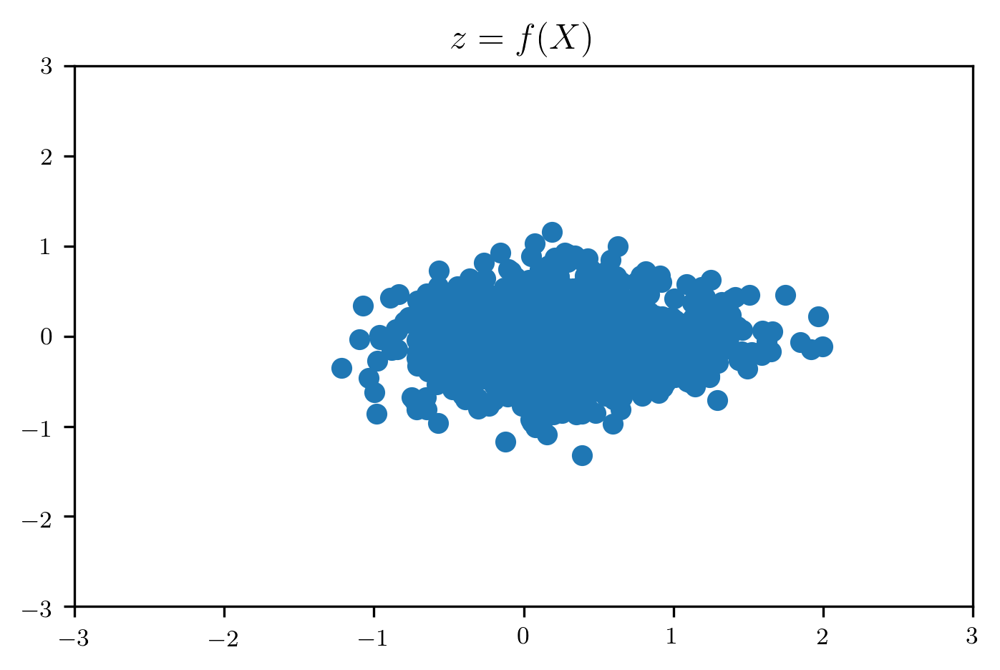

In [49]:
X_rho_u_step = next(iter(X_rho_u_dataloader))
label_step = X_rho_u_step[:,0:2]
condition_step = X_rho_u_step[:,2:4]

z = flow.f(label_step,condition_step)[0].detach().numpy()
# plt.subplot(221)
plt.scatter(z[:, 0], z[:, 1])
plt.title(r'$z = f(X)$')

# plt.axis("equal")
plt.xlim([-3,3])
plt.ylim([-3,3])

# z = np.random.multivariate_normal(np.zeros(2), np.eye(2), 1000)
# plt.subplot(222)
# plt.scatter(z[:, 0], z[:, 1])
# plt.title(r'$z \sim p(z)$')

# plt.subplot(223)
# x = datasets.make_moons(n_samples=1000, noise=.05)[0].astype(np.float32)
# plt.scatter(x[:, 0], x[:, 1], c='r')
# plt.title(r'$X \sim p(X)$')

# plt.subplot(224)
# x = flow.sample(1000).detach().numpy()
# plt.scatter(x[:, 0, 0], x[:, 0, 1], c='r')
# plt.title(r'$X = g(z)$')